# Women's Health Visibility Worldwide: An early-stage exploratory analysis based on the Dollar Street dataset

Endometriosis is a disease that affects an estimated 10% to 15% of all women worldwide [1]. Despite being a pervasive condition, its causes and treatment are still open research fields with significant advances being made only in recent decades. This lack of knowledge triggers many issues, from the spread of disinformation around it to undernotification of new cases and slow diagnosis of the disease, which currently averages ten to twelve years around the globe [2]. 

In this proof of concept project, we'll analyze potential signals of access to basic women's health resources as they appear in photos taken at families' homes across the globe through the Dollar Street project, authored by Coactive and ML Commons [3]. The intent here is not to diagnose diseases directly but rather to explore whether basic items indispensable for women to maintain a good standard of personal hygiene and menstrual health appear with similar frequency in countries with different levels of average income.

## What data we use
- `images_v2.csv` (available in the Dollar Street project dataset): per-image metadata including `country.name`, `income` (household monthly income), and `topics` (comma-separated topic tags).
- Wealth: As a proxy for wealth, we'll use the median household monthly income within the dataset. 

## What we measure
For each country and topic:
- **Count**: number of images tagged with the topic.
- **Rate per 1,000 images**: `count / total_images_in_country * 1000`.

## Topics analyzed
- Menstruation pads / tampax
- Contraceptives
- Medication
- Source of heat (as a proxy of comfort conditions)
- Bathroom Privacy
- Shower
- Soap for hands and body
- Toilet paper

In [10]:
# Install required modules (run once)
%pip install pandas numpy plotly ipywidgets scipy pycountry matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 833.1 kB/s eta 0:00:00MB/s eta 0:00:01
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 kB 2.3 MB/s eta 0:00:00 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 15.3 MB/s eta 0:00:00m eta 0:00:010:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.4/253.4 kB 22.7 MB/s eta 0:00:00
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 15.7 MB/s eta 0:00:00 MB/s eta 0:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.3/65.3 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 15.7 MB/s eta 0:00:00 MB/s eta 0:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.8/122.8 kB 8.2 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.3.1 -> 25.3
[notice] To update, run: python3.10 -m pip install --upgrade pip
Note: you may need to restart the

In [1]:
# Let's import the necessary packages and the dataset
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import ipywidgets as widgets
from scipy import stats

try:
    import pycountry
except ImportError:
    pycountry = None

csv_path = 'images_v2.csv'  # assumes notebook runs from same folder as the CSV
df = pd.read_csv(csv_path)
df.head()

,id,country.name,country.id,region.id,type,imageRelPath,topics,place,income
0,5d4be6cecf0b3a0f3f344586,Burundi,bi,af,image,assets/5d4be6cecf0b3a0f3f344586/5d4be6cecf0b3a...,icons,butoyi,26.994581
1,5d4bf31ccf0b3a0f3f359814,Burundi,bi,af,image,assets/5d4bf31ccf0b3a0f3f359814/5d4bf31ccf0b3a...,Family snapshots,butoyi,26.994581
2,5d4bf31ccf0b3a0f3f35982a,Burundi,bi,af,image,assets/5d4bf31ccf0b3a0f3f35982a/5d4bf31ccf0b3a...,Cutlery,butoyi,26.994581
3,5d4bf31ccf0b3a0f3f35982e,Burundi,bi,af,image,assets/5d4bf31ccf0b3a0f3f35982e/5d4bf31ccf0b3a...,Family,butoyi,26.994581
4,5d4bf31ccf0b3a0f3f359830,Burundi,bi,af,image,assets/5d4bf31ccf0b3a0f3f359830/5d4bf31ccf0b3a...,Place where eating dinner,butoyi,26.994581


In [2]:
# Explode comma-separated topics into one topic per row
topics_exploded = (
    df.assign(topic=df['topics'].fillna('').str.split(','))
      .explode('topic')
)
topics_exploded['topic'] = topics_exploded['topic'].str.strip()

# Basic per-country totals + wealth proxy
country_totals = df.groupby('country.name').agg(
    total_images=('id', 'count'),
    median_income=('income', 'median'),
    mean_income=('income', 'mean'),
).reset_index()
country_totals.sort_values('total_images', ascending=False).head(10)

,country.name,total_images,median_income,mean_income
20,India,4704,1295.000000,2068.504144
10,Colombia,2322,1392.000000,1577.713752
60,United States,1794,2001.000000,2391.374025
9,China,1754,960.000000,1800.911334
3,Brazil,1656,685.000000,1193.967391
21,Indonesia,1515,268.000000,448.034534
34,Nepal,1490,201.099088,610.818662
41,Philippines,1419,195.453359,306.064157
35,Netherlands,1163,1816.000000,2045.674979
45,Serbia,1025,430.000000,1189.739512


In [6]:
# From earlier exploration of the dataset, we've gathered the topics that 
# might be related to women's health
from typing import cast

TOPICS = [
    'Menstruation pads / tampax',
    'Contraceptives',
    'Medication',
    'Source of heat',
    'Bathroom Privacy',
    'Shower',
    'Soap for hands and body',
    'Toilet paper',
]

def per_country_topic_table(topic: str, min_images_per_country: int = 50) -> pd.DataFrame:
    tdf = topics_exploded[topics_exploded['topic'] == topic]
    counts = tdf.groupby('country.name').size().reset_index()
    counts.columns = ['country.name', 'topic_images']
    merged = country_totals.merge(counts, on='country.name', how='left').fillna({'topic_images': 0})
    merged = merged[merged['total_images'] >= min_images_per_country].copy()
    merged['rate_per_1000'] = merged['topic_images'] / merged['total_images'] * 1000.0
    merged['log10_median_income'] = np.log10(merged['median_income'].clip(lower=1e-6))
    return cast(pd.DataFrame, merged)

# Build a single wide table with one row per country and columns per topic
tables = []
for t in TOPICS:
    tmp = per_country_topic_table(t)
    tmp = tmp[['country.name', 'total_images', 'median_income', 'log10_median_income', 'topic_images', 'rate_per_1000']].copy()
    tmp.columns = ['country', 'total_images', 'median_income', 'log10_median_income', f'{t}__count', f'{t}__per_1000']
    tables.append(tmp)

wide = tables[0]
for t in tables[1:]:
    wide = wide.merge(t, on=['country', 'total_images', 'median_income', 'log10_median_income'], how='outer')

wide = wide.fillna(0)
wide.head()

,country,total_images,median_income,log10_median_income,Menstruation pads / tampax__count,Menstruation pads / tampax__per_1000,Contraceptives__count,Contraceptives__per_1000,Medication__count,Medication__per_1000,Source of heat__count,Source of heat__per_1000,Bathroom Privacy__count,Bathroom Privacy__per_1000,Shower__count,Shower__per_1000,Soap for hands and body__count,Soap for hands and body__per_1000,Toilet paper__count,Toilet paper__per_1000
0,Austria,269,3003.000000,3.477555,2.0,7.434944,0.0,0.000000,2.0,7.434944,4.0,14.869888,1.0,3.717472,2.0,7.434944,2.0,7.434944,3.0,11.152416
1,Bangladesh,604,85.476771,1.931848,0.0,0.000000,0.0,0.000000,5.0,8.278146,0.0,0.000000,12.0,19.867550,4.0,6.622517,7.0,11.589404,5.0,8.278146
2,Bolivia,304,254.000000,2.404834,0.0,0.000000,0.0,0.000000,1.0,3.289474,1.0,3.289474,5.0,16.447368,2.0,6.578947,0.0,0.000000,3.0,9.868421
3,Brazil,1656,685.000000,2.835691,5.0,3.019324,1.0,0.603865,12.0,7.246377,2.0,1.207729,10.0,6.038647,13.0,7.850242,13.0,7.850242,20.0,12.077295
4,Burkina Faso,528,53.645204,1.729531,0.0,0.000000,0.0,0.000000,4.0,7.575758,0.0,0.000000,12.0,22.727273,6.0,11.363636,5.0,9.469697,6.0,11.363636


## Correlation plot (wealth proxy vs visibility)
Below we compute Spearman correlations between the wealth proxy (log10 median household income) and topic visibility. For each topic, we plot the number of occurrences per 1,000 images of each topic versus the median monthly household income per country.

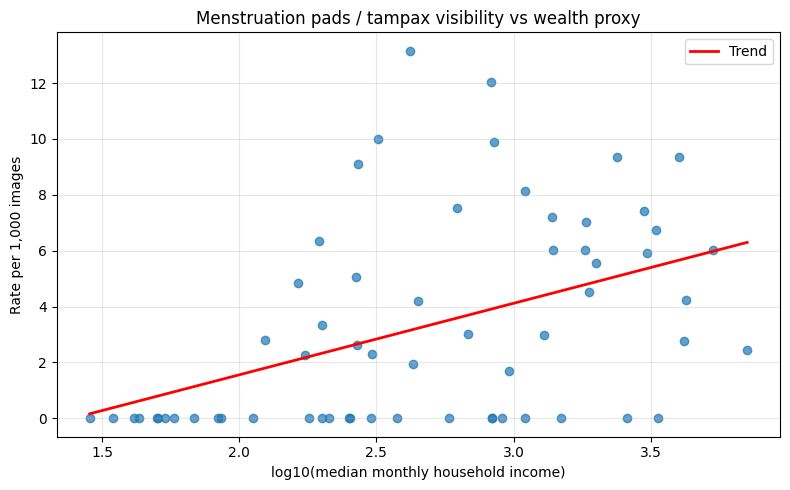

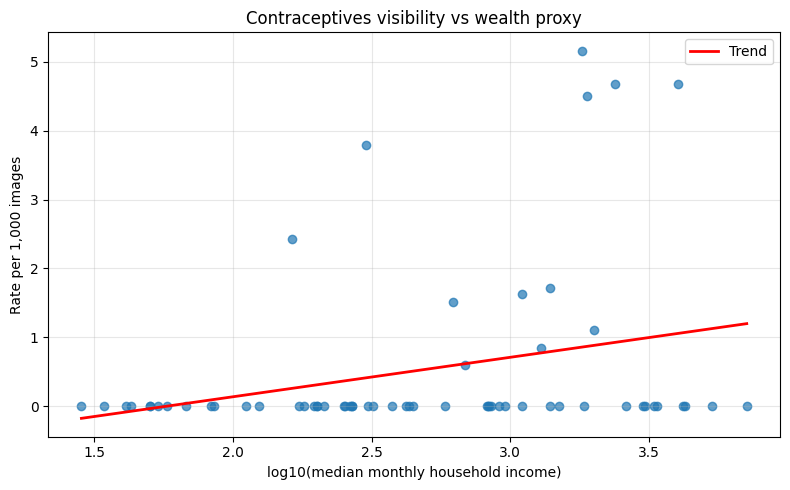

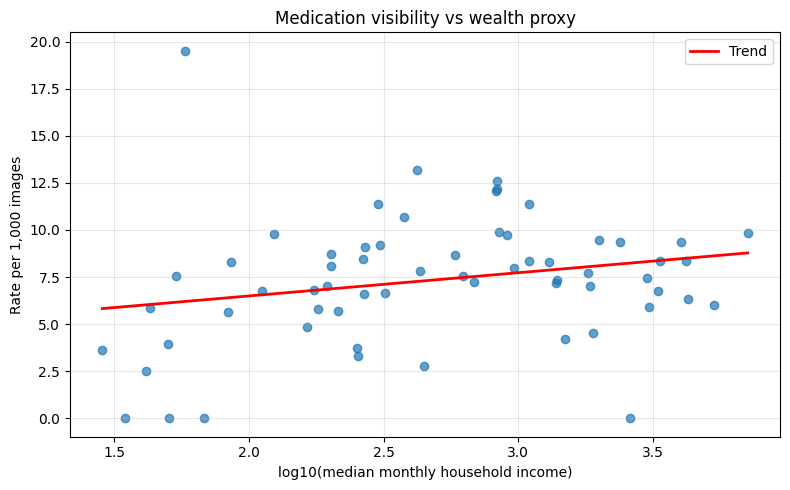

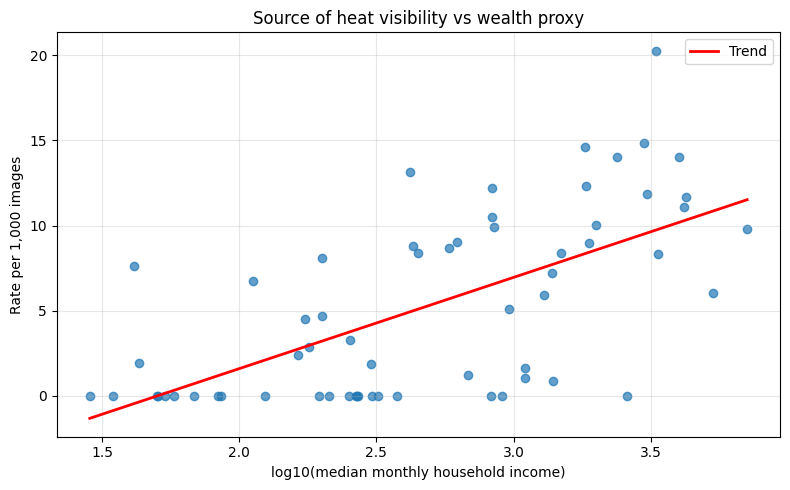

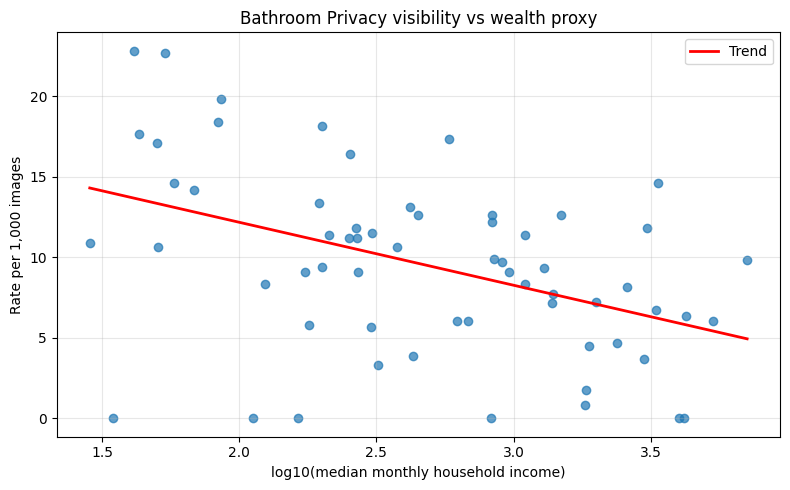

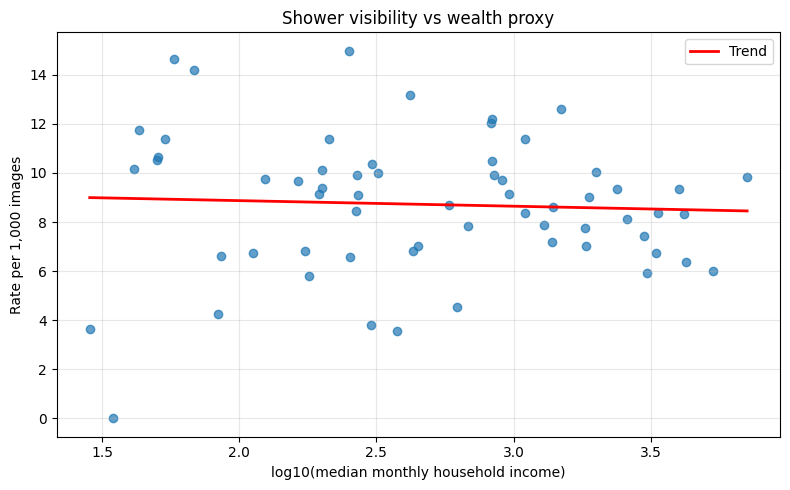

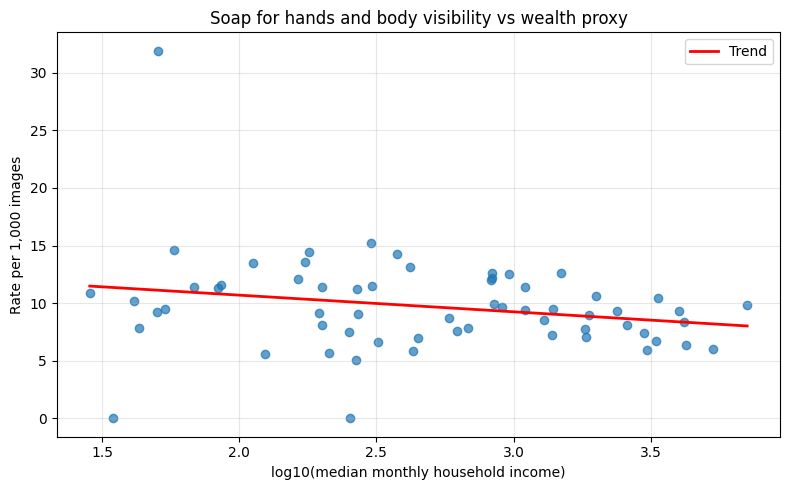

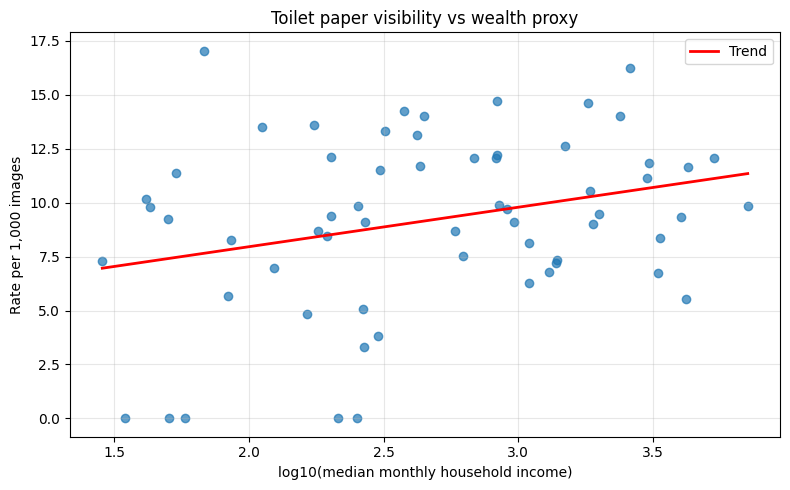

In [7]:
# Scatter plots: topic visibility (rate per 1,000 images) vs log10 country median monthly household income
import matplotlib.pyplot as plt
import os

out_dir = 'endo_access_lens_regen'
os.makedirs(out_dir, exist_ok=True)

def topic_to_slug(topic: str) -> str:
    return topic.replace(' / ', '_').replace(' ', '_').lower()

for topic in TOPICS:
    col = f'{topic}__per_1000'
    x = wide['log10_median_income'].to_numpy()
    y = wide[col].to_numpy()
    # Linear trend line
    coef = np.polyfit(x, y, 1)
    x_line = np.linspace(x.min(), x.max(), 100)
    y_line = np.polyval(coef, x_line)
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.scatter(x, y, alpha=0.7)
    ax.plot(x_line, y_line, 'r-', linewidth=2, label='Trend')
    ax.set_xlabel('log10(median monthly household income)')
    ax.set_ylabel('Rate per 1,000 images')
    ax.set_title(f'{topic} visibility vs wealth proxy')
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    slug = topic_to_slug(topic)
    fig.savefig(os.path.join(out_dir, f'scatter_{slug}.png'), dpi=150, bbox_inches='tight')
    plt.show()
    plt.close()

# Analysis 

As shown in the charts above, clear tendencies are displayed as we plot the appearance of certain health-related items vs wealth by country (proxied here by the median monthly household income). It is interesting to notice that for the Menstruation pads, Contraceptives, Medication, Source of heat and Toilet paper topics there seems to be a direct relation between income and the appearance of those items in a household. It is unclear as of now whether that relationship is causal, but it is fair to hypothesize that those items might be more expensive to acquire and impose higher burdens for families and countries with less economic power. 
The images on the dataset provide some examples that support that hypothesis:

*Medication in France, avg. income of $14,753/month*

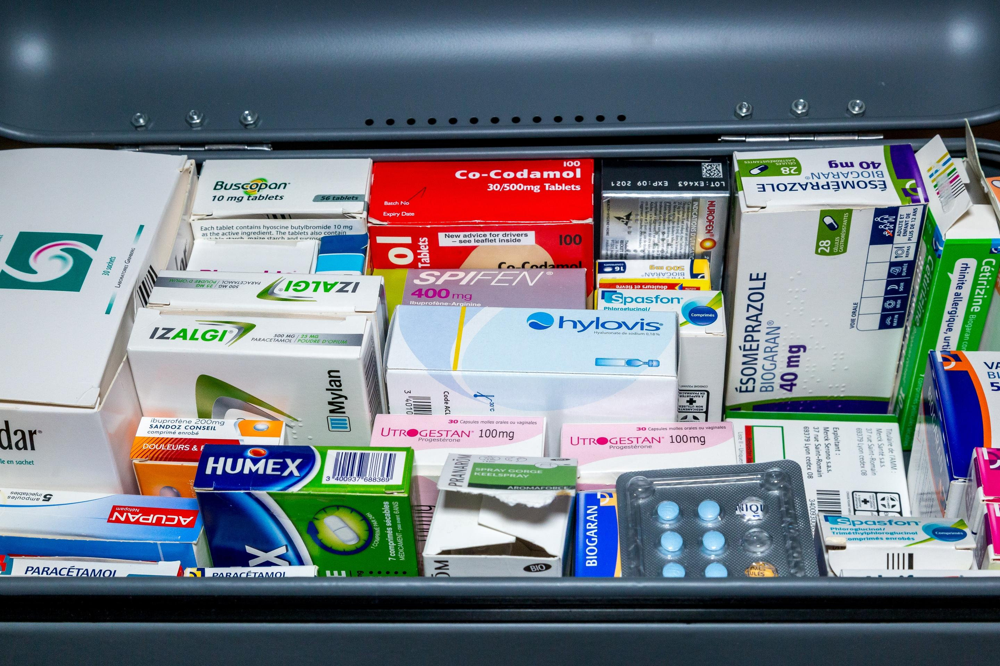

*Medication in India, avg. income of $31/month*

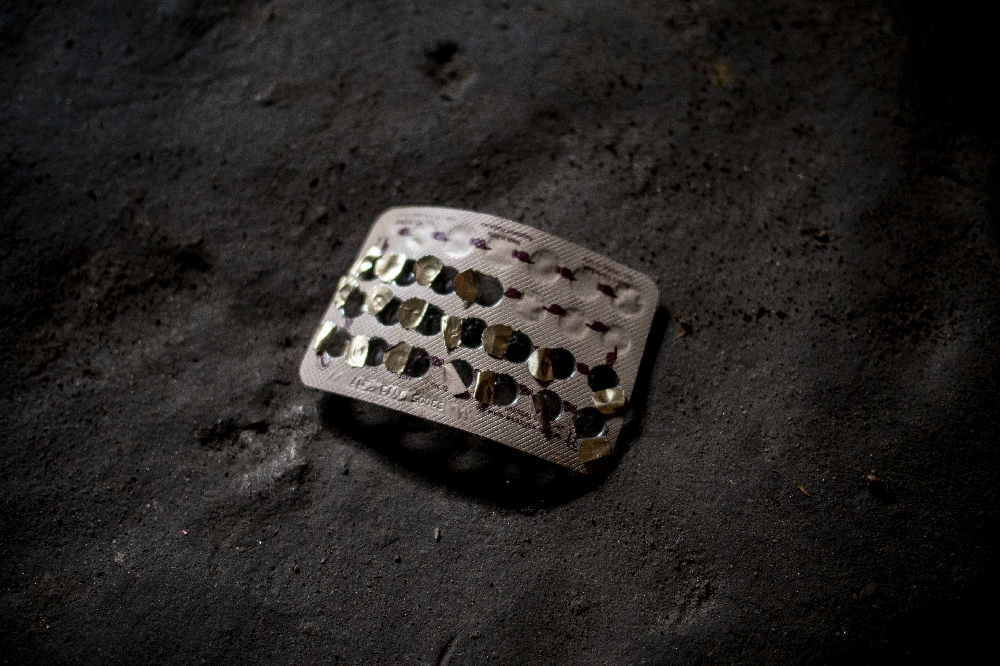

*Menstruation pads / tampax in Romania, avg. income of $6,256/month.*

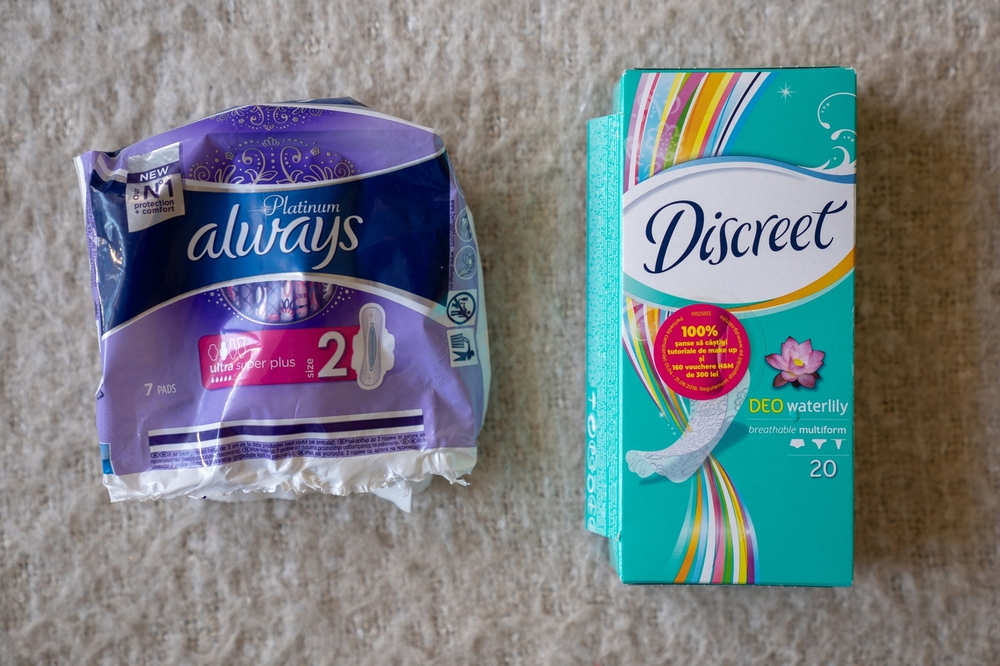

*Menstruation pads / tampax — Togo, avg. income of $45/month.*

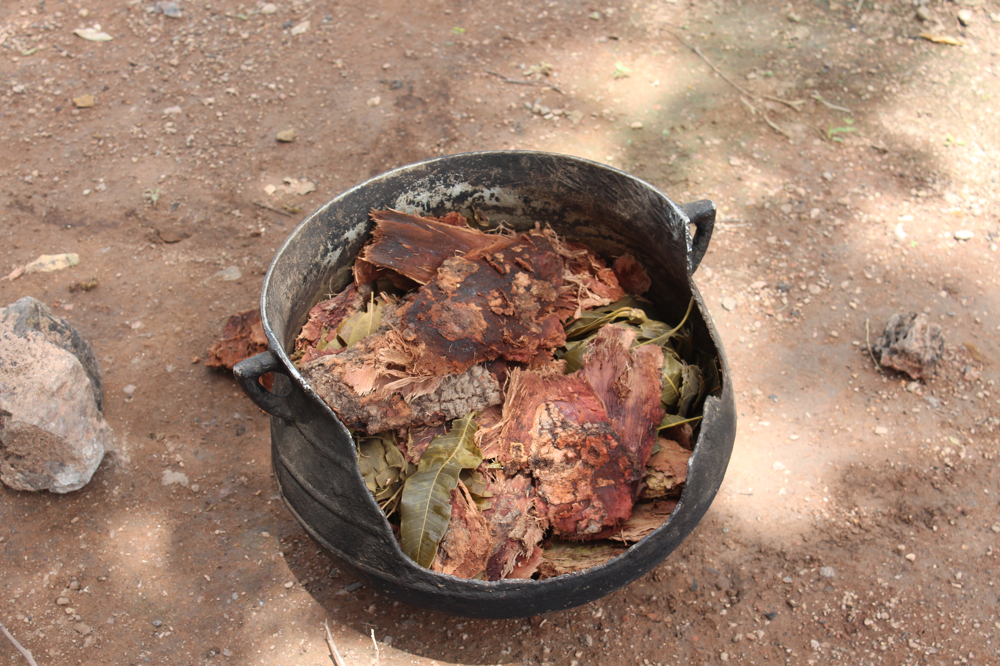

In [13]:
import os
from IPython.display import Image, display, Markdown

images_dir = 'images'
# Individual caption per image (filename -> caption). Add or edit entries as needed.
IMAGE_CAPTIONS = {
    'menstruation-pad-france.jpg': 'Menstruation pads / tampax in Romania, avg. income of $6,256/month.',
    'menstruation-pad-togo.JPG': 'Menstruation pads / tampax — Togo, avg. income of $45/month.',
    'medication-france.jpg': 'Medication in France, avg. income of $14,753/month',
    'medication-india.jpg': 'Medication in India, avg. income of $31/month'
}

def caption_for(f):
    if f in IMAGE_CAPTIONS:
        return IMAGE_CAPTIONS[f]
    base = os.path.splitext(f)[0]
    return base.replace('-', ' ').replace('_', ' ').title()

if os.path.isdir(images_dir):
    for f in sorted(os.listdir(images_dir)):
        if f.lower().endswith(('.jpg', '.jpeg', '.png', '.gif', '.webp')):
            path = os.path.join(images_dir, f)
            display(Markdown(f"*{caption_for(f)}*"))
            display(Image(filename=path, width=400))
else:
    display(Markdown(f'*Folder `{images_dir}/` not found.*'))

At the same time, we also observe reversed relationships for other topics, such as Bathroom Privacy, Shower Visibility and Soap for Hands. While this might be more difficult to speculate about, it is possible that photographers couldn't get as much access to private spaces in richer countries than they did in poorer ones, where often bathrooms might be in public sight, for example.

# Conclusion 

Through this proof-of-concept project, we have gathered enough evidence to support the idea that it is possible to gauge the level of support women have in varying countries as it relates to their health habits, especially those related to the menstrual cycle through the items they have at home. The presence or absence of such objects reveals patterns in healthcare, which directly affect time to diagnosis and later treatment. Investigating symptoms such as acute pain during the menstrual period and intense blood flow is key to an early diagnosis of endometriosis and other diseases, which in turn prevents later-stage physical and psychological consequences of such conditions. 

In this early-stage exploratory analysis we've used the Dollar Street dataset and reference paper to investigate a possible correlation between wealth and access to basic health needs for the female population. We found that there seems to be relevant correlation aspects between the variables, but further exploration is needed to determine causal relationships. We've also showcased anecdotal evidence from the images in the dataset that help us observe the relationships shown by the charts. 


# Limitations and Future Work 

As a very early exploratory study of this theme, we've only relied on information available in the Dollar Street dataset. Additional data points such as GDP per capita and national expenditure on women's health public policies could help expand the understanding around this topic. 
We also have to note that the Dollar Street images do not reflect an equal distribution of images per topic for each country, so deviations might be found when exploring deeper. Despite this possibility, the number of images available (N=38,479) and their respective metadata still allow for a robust analysis. 

## References

[1] World Health Organization. *Endometriosis*. WHO Fact Sheets; 2023. https://www.who.int/news-room/fact-sheets/detail/endometriosis

[2] Ballard K, Lowton K, Wright J. What’s the delay? A qualitative study of women’s experiences of reaching a diagnosis of endometriosis. *Fertil Steril*. 2006;86(5):1296-1301. doi:10.1016/j.fertnstert.2006.04.054.

[3] Gaviria Rojas WA, Diamos S, Kini KR, Kanter D, Reddi VJ, Coleman C. The Dollar Street dataset: images representing the geographic and socioeconomic diversity of the world. In: *Proceedings of the 36th Conference on Neural Information Processing Systems (NeurIPS 2022)*, Datasets and Benchmarks Track; 2022. https://openreview.net/forum?id=qnfYsave0U4